<a href="https://colab.research.google.com/github/Shubham246763/geomagnetic_storms/blob/main/Pnsr_geomag_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from xgboost import XGBClassifier
import warnings

warnings.filterwarnings('ignore')


In [ ]:
# Load data
data = pd.read_csv('/content/kp.txt', delim_whitespace=True, header=None)

# Assign column names based on the given format
columns = ['year', 'month', 'day', 'decimal_day', 'sunspot_number', 'solar_flux',
           'ap1', 'ap2', 'ap3', 'ap4', 'ap5', 'ap6', 'ap7', 'ap8',
           'Kp1', 'Kp2', 'Kp3', 'Kp4', 'Kp5', 'Kp6', 'Kp7', 'Kp8',
           'ap_avg', 'Ap', 'solar_flux_adj', 'flux_obs', 'is_geomagnetic_storm', 'extra_column']

data.columns = columns

# Drop 'extra_column' if it's irrelevant
data.drop('extra_column', axis=1, inplace=True)

# Inspect data
print(data.head())
print(data.info())
print(data.describe())


   year  month  day  decimal_day  sunspot_number  solar_flux  ap1    ap2  \
0  2020      2    1        32173         32173.5        2543   26  1.000   
1  2020      2    2        32174         32174.5        2543   27  2.000   
2  2020      2    3        32175         32175.5        2544    1  1.333   
3  2020      2    4        32176         32176.5        2544    2  2.000   
4  2020      2    5        32177         32177.5        2544    3  1.667   

     ap3    ap4  ...  Kp4  Kp5  Kp6  Kp7  Kp8  ap_avg  Ap  solar_flux_adj  \
0  0.333  1.000  ...    4    3    7    7    6       9   5               6   
1  1.000  1.000  ...    4    3    2    5    9       9   5               0   
2  2.000  1.333  ...    5    2    2    2    4       2   4               0   
3  1.667  0.667  ...    3    4    3    5    5      12   6               0   
4  2.000  1.333  ...    5    6    4    2    3       2   4               0   

   flux_obs  is_geomagnetic_storm  
0      72.5                  70.4  
1      7

In [ ]:
# Calculate skewness and kurtosis
skewness = data.skew()
kurtosis = data.kurtosis()

print("Skewness:")
print(skewness)

print("\nKurtosis:")
print(kurtosis)


Skewness:
year                     0.100088
month                    0.124471
day                      0.013529
decimal_day              0.000000
sunspot_number           0.000000
solar_flux               0.000484
ap1                      0.008716
ap2                      0.699419
ap3                      0.886205
ap4                      1.075757
ap5                      1.234025
ap6                      1.129903
ap7                      1.153048
ap8                      1.142652
Kp1                      0.895305
Kp2                     13.617798
Kp3                      7.865287
Kp4                      8.493981
Kp5                     17.136507
Kp6                     10.375751
Kp7                      8.706400
Kp8                      8.930442
ap_avg                   9.032474
Ap                      11.224927
solar_flux_adj           0.515376
flux_obs                 0.538282
is_geomagnetic_storm     0.546534
dtype: float64

Kurtosis:
year                     -1.132077
month      

In [ ]:
# Check the number of unique values in 'is_geomagnetic_storm'
unique_values = data['is_geomagnetic_storm'].nunique()

# Determine if 'is_geomagnetic_storm' is a binary indicator
is_binary = unique_values == 2

# Check balance counts if it is a binary indicator
if is_binary:
    balance_counts = data['is_geomagnetic_storm'].value_counts()
    print("\nBalance Check (is_geomagnetic_storm):")
    print(balance_counts)

# Print the result based on unique values count
if unique_values > 5:
    print("The 'is_geomagnetic_storm' column has more than 5 unique values: False")
else:
    print("The 'is_geomagnetic_storm' column has 5 or fewer unique values: True")


The 'is_geomagnetic_storm' column has more than 5 unique values: False


In [ ]:
# Create a target variable for geomagnetic storm prediction
data['Kp_avg'] = data[['Kp1', 'Kp2', 'Kp3', 'Kp4', 'Kp5', 'Kp6', 'Kp7', 'Kp8']].mean(axis=1)

# Define a threshold for geomagnetic storm (e.g., Kp_avg > 5 is considered a storm)
data['geomagnetic_storm'] = (data['Kp_avg'] > 5).astype(int)

# Drop columns that are not needed
data.drop(['Kp1', 'Kp2', 'Kp3', 'Kp4', 'Kp5', 'Kp6', 'Kp7', 'Kp8', 'Kp_avg'], axis=1, inplace=True)

# Check for missing values
print(data.isnull().sum())


year                    0
month                   0
day                     0
decimal_day             0
sunspot_number          0
solar_flux              0
ap1                     0
ap2                     0
ap3                     0
ap4                     0
ap5                     0
ap6                     0
ap7                     0
ap8                     0
ap_avg                  0
Ap                      0
solar_flux_adj          0
flux_obs                0
is_geomagnetic_storm    0
geomagnetic_storm       0
dtype: int64


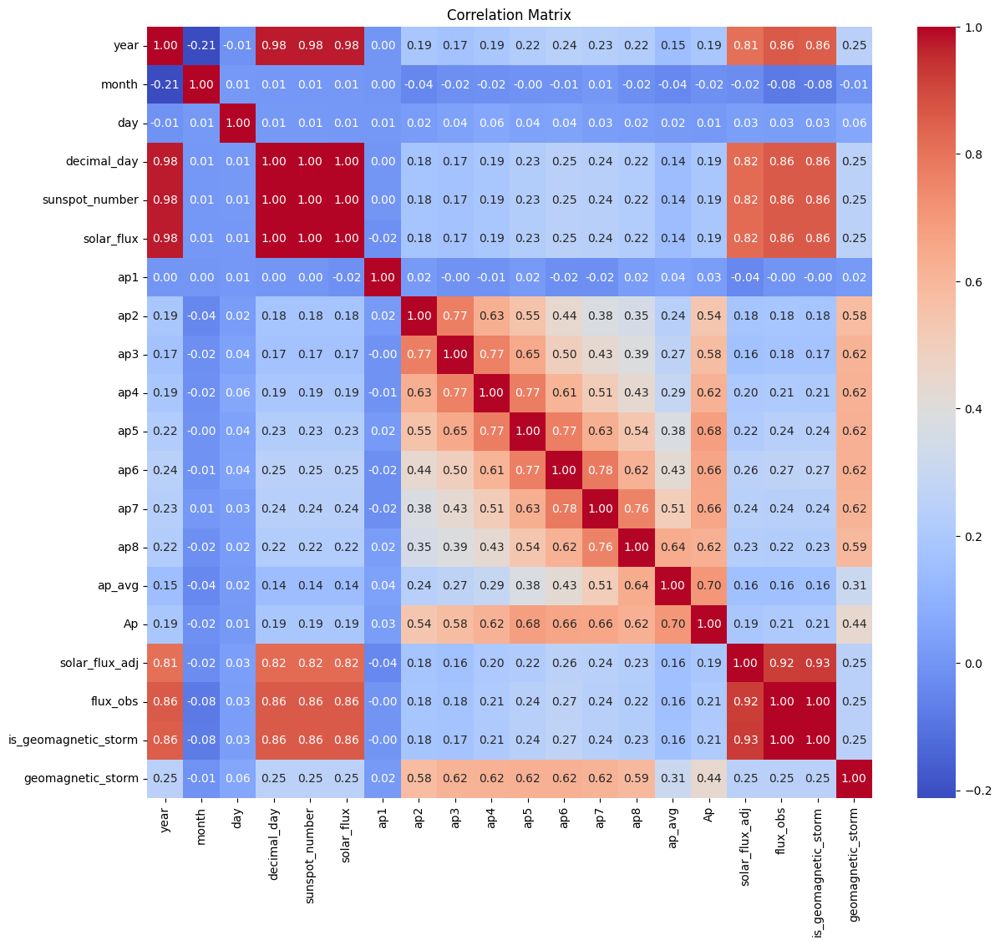

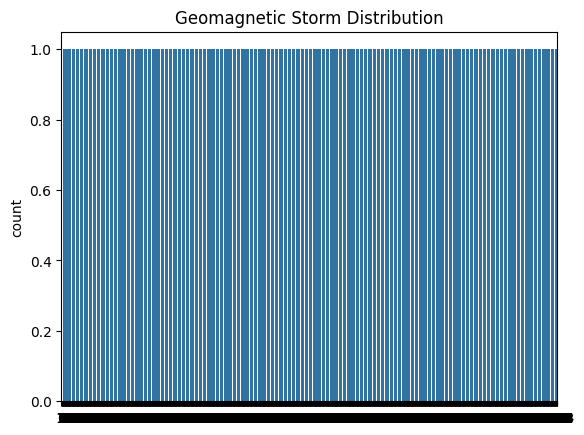

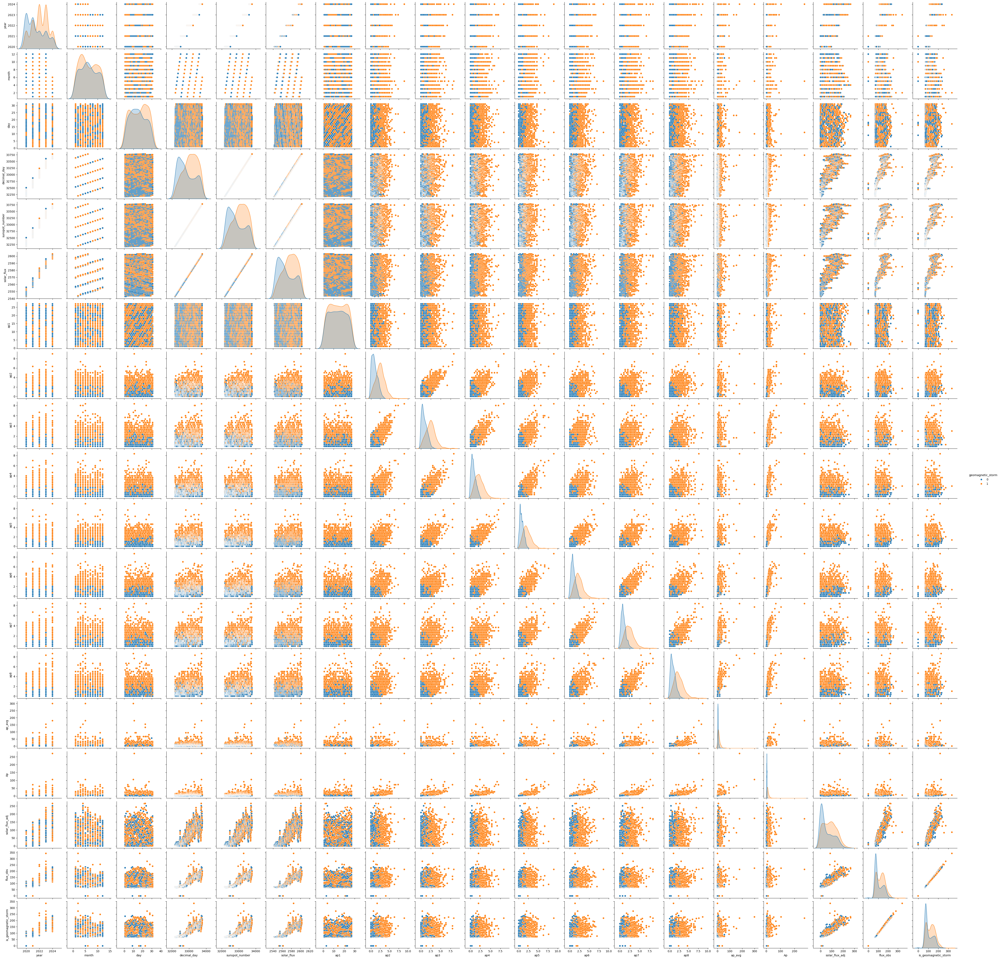

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Correlation matrix
plt.figure(figsize=(18, 16))  # Increase the figure size
sns.heatmap(data.corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Distribution of target variable
plt.figure(figsize=(8, 6))  # Adjust figure size as needed
sns.countplot(data['geomagnetic_storm'])
plt.title('Geomagnetic Storm Distribution')
plt.show()

# Pairplot to visualize relationships
plt.figure(figsize=(40,40))  # Increase the figure size
sns.pairplot(data, hue='geomagnetic_storm')
plt.show()


[0.62708381 0.26443722 0.04950793]


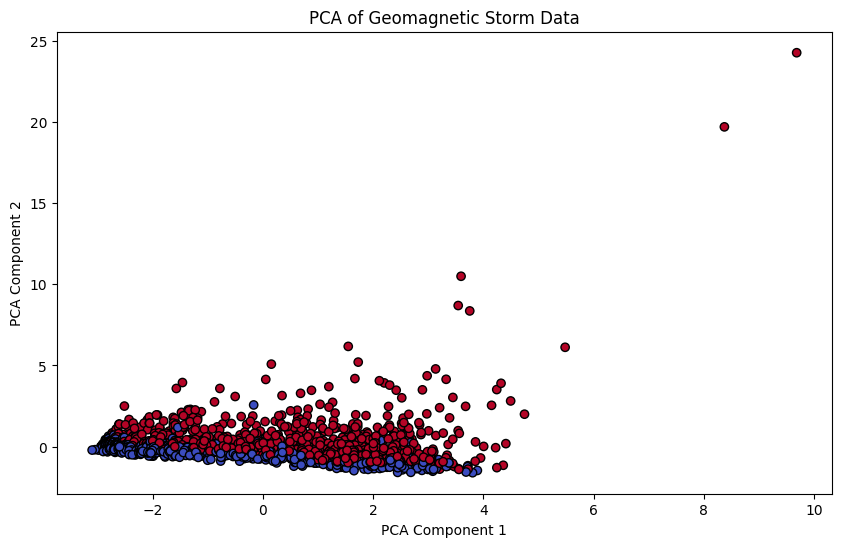

In [ ]:
# Features and target
features = ['sunspot_number', 'solar_flux', 'ap_avg', 'Ap', 'solar_flux_adj', 'flux_obs']
target = 'geomagnetic_storm'

X = data[features]
y = data[target]

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# PCA explained variance
print(pca.explained_variance_ratio_)

# Plot PCA components
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='coolwarm', edgecolor='k')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA of Geomagnetic Storm Data')
plt.show()


In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
rf = RandomForestClassifier(random_state=42, n_estimators=100)
gb = GradientBoostingClassifier(random_state=42, n_estimators=100)
svc = SVC(probability=True, random_state=42)
xgb = XGBClassifier(random_state=42, n_estimators=100)

# Train models
rf.fit(X_train, y_train)
gb.fit(X_train, y_train)
svc.fit(X_train, y_train)
xgb.fit(X_train, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

Accuracy for RandomForestClassifier: 0.9719626168224299
              precision    recall  f1-score   support

           0       0.97      0.96      0.97       141
           1       0.97      0.98      0.98       180

    accuracy                           0.97       321
   macro avg       0.97      0.97      0.97       321
weighted avg       0.97      0.97      0.97       321



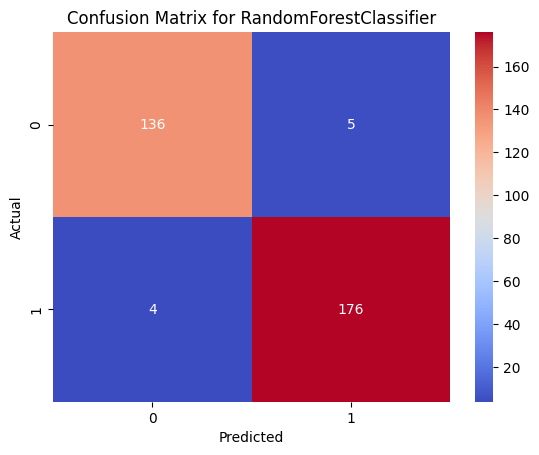

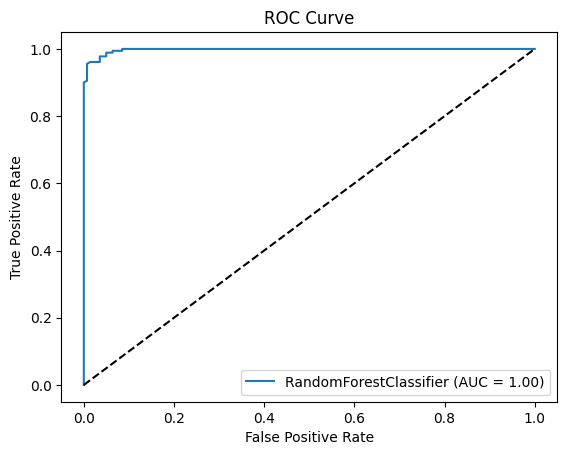

Accuracy for GradientBoostingClassifier: 0.9688473520249221
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       141
           1       0.98      0.97      0.97       180

    accuracy                           0.97       321
   macro avg       0.97      0.97      0.97       321
weighted avg       0.97      0.97      0.97       321



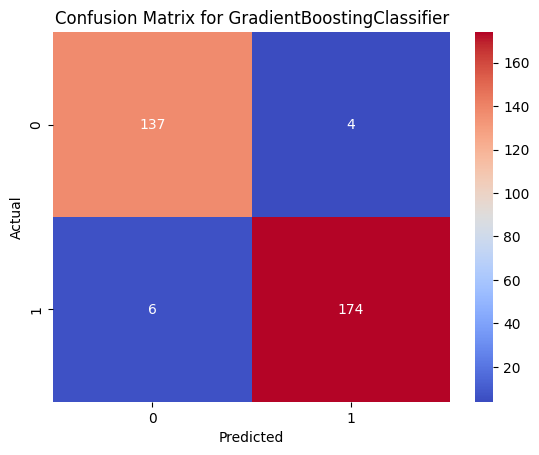

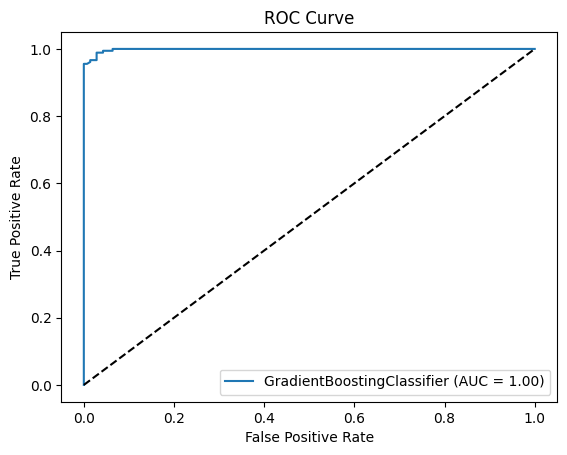

Accuracy for SVC: 0.5607476635514018
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       141
           1       0.56      1.00      0.72       180

    accuracy                           0.56       321
   macro avg       0.28      0.50      0.36       321
weighted avg       0.31      0.56      0.40       321



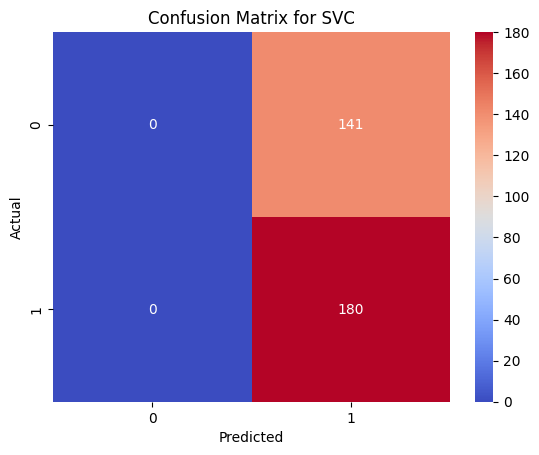

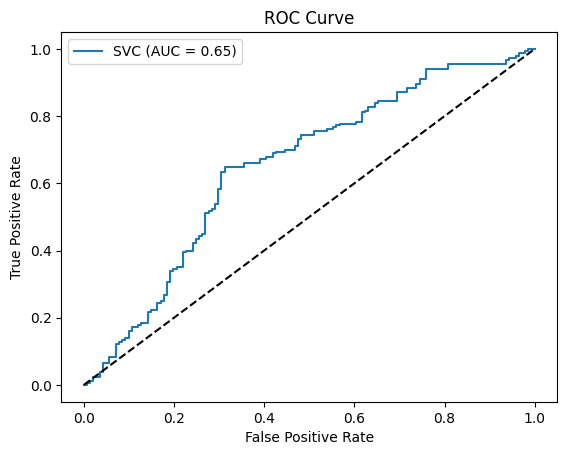

Accuracy for XGBClassifier: 0.9688473520249221
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       141
           1       0.98      0.97      0.97       180

    accuracy                           0.97       321
   macro avg       0.97      0.97      0.97       321
weighted avg       0.97      0.97      0.97       321



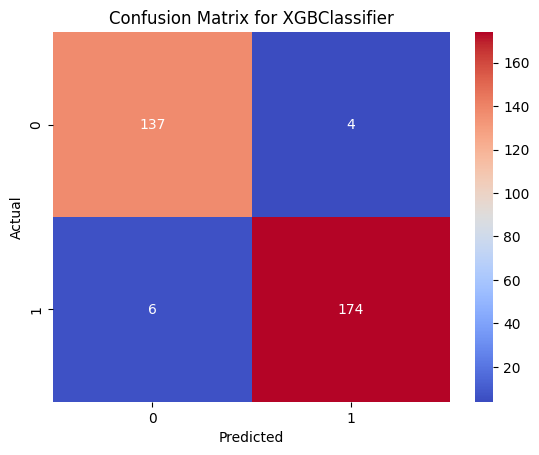

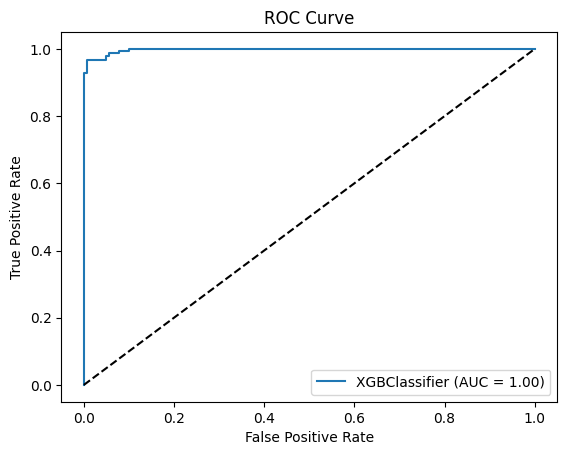

In [ ]:
# Function to evaluate models
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    print(f"Accuracy for {model.__class__.__name__}: {accuracy_score(y_test, y_pred)}")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm')
    plt.title(f'Confusion Matrix for {model.__class__.__name__}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # ROC Curve
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{model.__class__.__name__} (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.show()

# Evaluate all models
evaluate_model(rf, X_test, y_test)
evaluate_model(gb, X_test, y_test)
evaluate_model(svc, X_test, y_test)
evaluate_model(xgb, X_test, y_test)


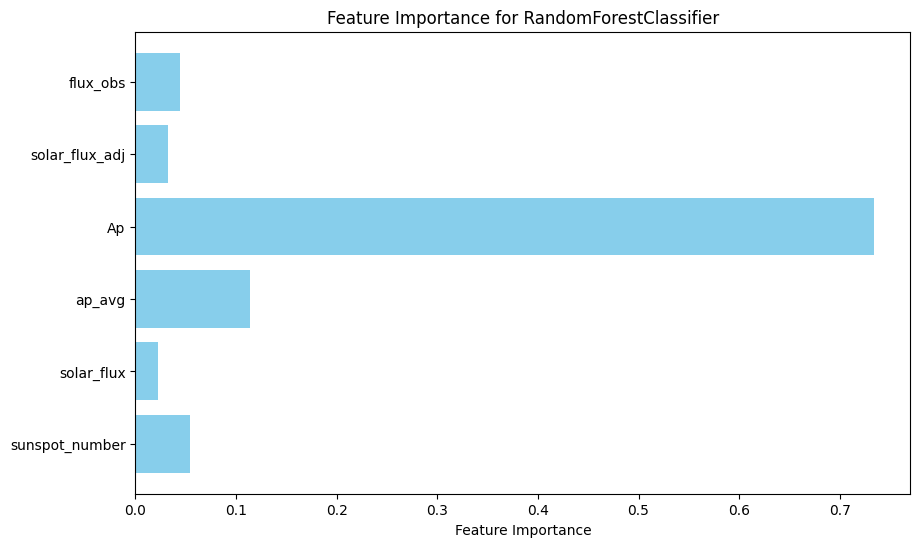

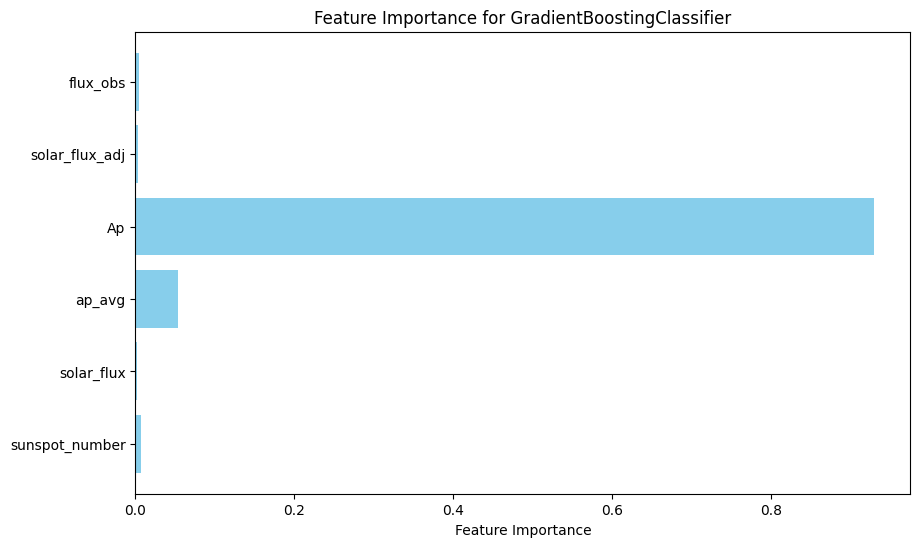

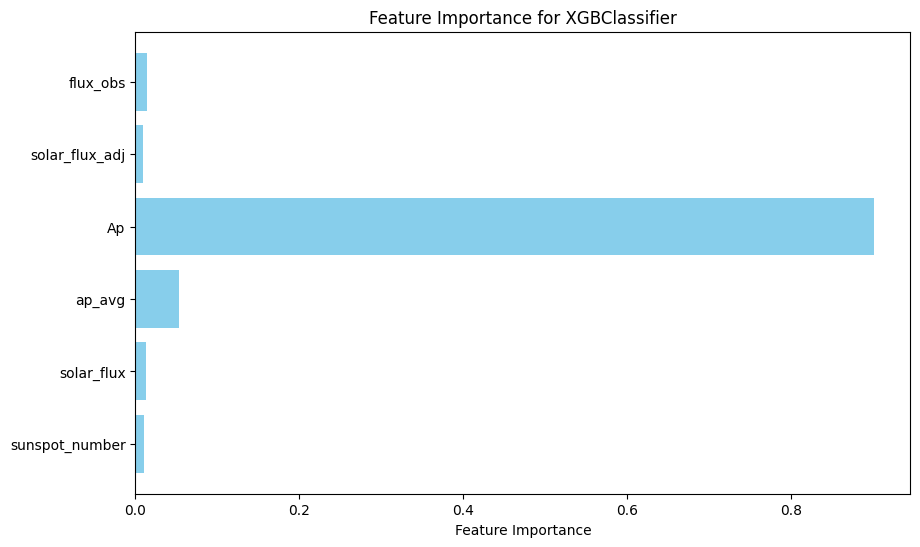

In [ ]:
# Feature importance for RandomForest
feature_importance_rf = rf.feature_importances_
features = np.array(features)

# Plot feature importance for RandomForest
plt.figure(figsize=(10, 6))
plt.barh(features, feature_importance_rf, color='skyblue')
plt.xlabel('Feature Importance')
plt.title(f'Feature Importance for {rf.__class__.__name__}')
plt.show()

# Feature importance for GradientBoosting
feature_importance_gb = gb.feature_importances_

# Plot feature importance for GradientBoosting
plt.figure(figsize=(10, 6))
plt.barh(features, feature_importance_gb, color='skyblue')
plt.xlabel('Feature Importance')
plt.title(f'Feature Importance for {gb.__class__.__name__}')
plt.show()

# Feature importance for XGBoost
feature_importance_xgb = xgb.feature_importances_

# Plot feature importance for XGBoost
plt.figure(figsize=(10, 6))
plt.barh(features, feature_importance_xgb, color='skyblue')
plt.xlabel('Feature Importance')
plt.title(f'Feature Importance for {xgb.__class__.__name__}')
plt.show()


In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.utils import to_categorical


In [ ]:
# One-hot encode the target variable
y_train_nn = to_categorical(y_train)
y_test_nn = to_categorical(y_test)


In [ ]:
# Define the neural network model
nn_model = Sequential()
nn_model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
nn_model.add(Dropout(0.5))
nn_model.add(Dense(32, activation='relu'))
nn_model.add(Dropout(0.5))
nn_model.add(Dense(2, activation='softmax'))  # 2 classes for binary classification

# Compile the model
nn_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history = nn_model.fit(X_train, y_train_nn, epochs=50, batch_size=32, validation_data=(X_test, y_test_nn))


Epoch 1/50
41/41 [==============================] - 2s 9ms/step - loss: 4997.6006 - accuracy: 0.5039 - val_loss: 311.9042 - val_accuracy: 0.4393
Epoch 2/50
41/41 [==============================] - 0s 3ms/step - loss: 2762.4329 - accuracy: 0.5179 - val_loss: 648.5804 - val_accuracy: 0.5607
Epoch 3/50
41/41 [==============================] - 0s 3ms/step - loss: 1662.6799 - accuracy: 0.4953 - val_loss: 360.2411 - val_accuracy: 0.5607
Epoch 4/50
41/41 [==============================] - 0s 3ms/step - loss: 878.1566 - accuracy: 0.5039 - val_loss: 104.8611 - val_accuracy: 0.5607
Epoch 5/50
41/41 [==============================] - 0s 3ms/step - loss: 467.9354 - accuracy: 0.5008 - val_loss: 9.1610 - val_accuracy: 0.5607
Epoch 6/50
41/41 [==============================] - 0s 4ms/step - loss: 320.2037 - accuracy: 0.5117 - val_loss: 1.0008 - val_accuracy: 0.5607
Epoch 7/50
41/41 [==============================] - 0s 3ms/step - loss: 163.5081 - accuracy: 0.4774 - val_loss: 0.6846 - val_accuracy: 0.

11/11 [==============================] - 0s 2ms/step
Accuracy for Neural Network: 0.5607476635514018
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       141
           1       0.56      1.00      0.72       180

    accuracy                           0.56       321
   macro avg       0.28      0.50      0.36       321
weighted avg       0.31      0.56      0.40       321



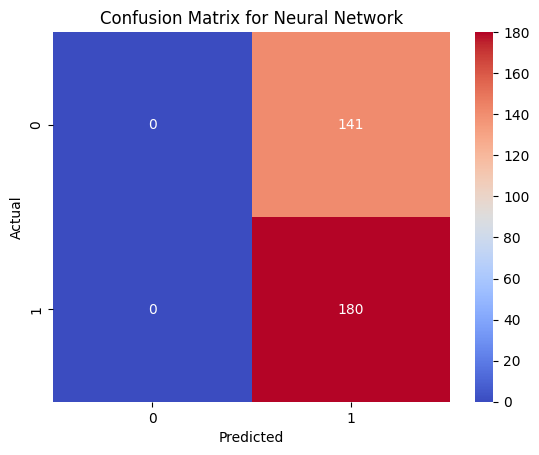

11/11 [==============================] - 0s 2ms/step


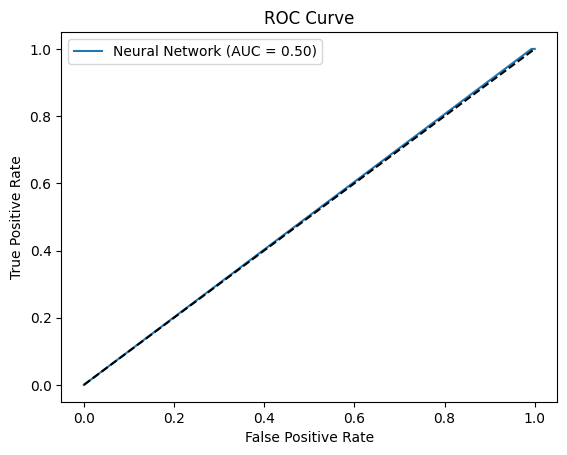

In [ ]:
# Evaluate the model
nn_model.evaluate(X_test, y_test_nn)

# Predict on test data
y_pred_nn = np.argmax(nn_model.predict(X_test), axis=-1)

# Convert one-hot encoded labels back to original
y_test_original = np.argmax(y_test_nn, axis=-1)

# Print classification report and accuracy
print(f"Accuracy for Neural Network: {accuracy_score(y_test_original, y_pred_nn)}")
print(classification_report(y_test_original, y_pred_nn))

# Confusion Matrix
cm = confusion_matrix(y_test_original, y_pred_nn)
sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm')
plt.title('Confusion Matrix for Neural Network')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# ROC Curve
y_pred_proba_nn = nn_model.predict(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test_original, y_pred_proba_nn)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label=f'Neural Network (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()
